Rather than working with the hierarchical model, let's see if we can do this with the $K$-samples approach as advocated by Hogg et al. 2010.

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = "retina"

from matplotlib import rcParams
# rcParams["savefig.dpi"] = 100
# rcParams["figure.dpi"] = 100
# rcParams["font.size"] = 20
# disable tex formatting (for Linux)
# rcParams["text.usetex"] = False
import matplotlib.pyplot as plt

import numpy as np
import emcee
import corner 
from astropy.table import Table

deg = np.pi/180

## Isotropically random sample

In [2]:
def calc_theta(i_disk, Omega_disk, i_star, Omega_star):
    '''
    Calculate the mutual inclination between two planes. Assumes all inputs in degrees.
    '''
    
    cos_theta = np.cos(i_disk * deg) * np.cos(i_star * deg) + \
        np.sin(i_disk * deg) * np.sin(i_star * deg) * np.cos((Omega_disk - Omega_star) * deg)
    theta = np.arccos(cos_theta)/deg
    
    return theta

In [81]:
# Generate the random isotropic sample

#np.random.seed(42)
np.random.seed(43)
N_systems = 10

# let's get a sample of uniformly oriented disks in 3D space 
# Generate randomly oriented momentum vector on the sky.
U = np.random.uniform(size=N_systems)
V = np.random.uniform(size=N_systems)

# spherical coordinates for angular momentum vector, uniformly distributed.
i_disks = np.arccos(2 * V - 1.0) / deg # polar angle
Omega_disks = 2 * np.pi * U / deg # azimuth

# draw new random numbers for the stars in the isotropic case
U = np.random.uniform(size=N_systems)
V = np.random.uniform(size=N_systems)

# spherical coordinates for angular momentum vector, uniformly distributed.
i_star_isos = np.arccos(2 * V - 1.0) / deg # polar angle
Omega_star_isos = 2 * np.pi * U / deg # azimuth

theta_isos = calc_theta(i_disks, Omega_disks, i_star_isos, Omega_star_isos)

# compute the mutual inclination of these too, and add it as a column
iso_sample = Table([i_disks, Omega_disks, i_star_isos, Omega_star_isos, theta_isos], \
                   names=["i_disk", "Omega_disk", "i_star", "Omega_star", "theta"])

In [82]:
iso_sample

i_disk,Omega_disk,i_star,Omega_star,theta
float64,float64,float64,float64,float64
102.1282104023996,41.41964390032042,171.78582007216252,305.6180931881501,78.82392456733773
52.8363079927885,219.2639541406133,85.04317552209085,349.72743291673964,117.5832032621232
119.4167054492001,48.02074710695578,92.79756180272774,138.73568918224973,89.248486904687
152.40328330277046,86.61226318752556,74.17218388915157,343.61572503911947,109.99555474445704
42.836466211521824,117.77006009201033,16.979703062015524,160.4730099022988,32.08661596512218
123.91359304643761,309.28949674149516,35.18204314750355,241.10087461985077,106.16234440972981
100.95401580087197,239.79247671528924,34.88454755121897,29.700017890975946,129.91860374533462
111.58043628912924,194.81839642202536,87.10468119840739,322.95548879335234,126.30631292678562
147.8518017971147,10.444976792769745,142.36925272748454,107.28126024795456,50.81240503454029


## Low mutual inclination sample 

Generate the sample with low mutual inclinations

In [5]:
def input_prob(theta):
    '''
    theta is in degrees.
    '''
    return np.sin(theta * deg) * np.exp(-0.5 * (theta - 5.0)**2 / (2**2))

# proposal probability 
def propose_prob(theta):
    '''
    theta is in degrees.
    '''
    return np.exp(-0.5 * (theta - 5.0)**2/(2**2))

In [83]:
# proposed values 
theta_props = np.random.normal(loc=5.0, scale=2.0, size=100000)

# since we know that the mutual inclination must be between 0 and 180, let's get rid of any values on the tail 
# of the Gaussian that exceed these ranges 
theta_props = theta_props[(theta_props > 0.0) & (theta_props < 180.0)]

# Evaluate the probability of Q for all samples
Qs = propose_prob(theta_props)

# Generate a random number [0, Q(Delta I)] for all samples 
us = np.random.uniform(low=0, high=Qs)

# Evaluate p(Delta I) for all samples
Ps = input_prob(theta_props)

# Keep the samples for which u <= P
theta_samples = theta_props[us <= Ps]

thetas = np.random.choice(theta_samples, size=N_systems) # degrees
phis = np.random.uniform(low=0, high=360., size=N_systems) # degrees

In [84]:
def P_x(xi):
    '''
    Calculate the transformation matrix about the X-axis. Assumes the angle is in degrees.
    '''
    x = xi * deg
    return np.array([[1, 0, 0], [0, np.cos(x), -np.sin(x)], [0, np.sin(x), np.cos(x)]])

def P_z(xi):
    '''
    Calculate the transformation matrix about the Z-axis. Assumes angle is in degrees.
    '''
    x = xi * deg
    return np.array([[np.cos(x), -np.sin(x), 0], [np.sin(x), np.cos(x), 0], [0, 0, 1]])

def get_xyz(theta, phi):
    '''
    Convert angles in the disk frame into x, y, z in the disk frame. All angles in degrees.
    '''
    return np.array([np.sin(theta * deg) * np.cos(phi * deg), \
                     np.sin(theta * deg) * np.sin(phi * deg), \
                     np.cos(theta * deg)])

def get_binary_parameters(i_disk, Omega_disk, theta, phi):
    '''
    Using the matrix math above, calculate i_star and Omega_star. Assumes all angles are in degrees.
    '''
    
    xyz = get_xyz(theta, phi)
    
    res = np.dot(P_z(-Omega_disk).T, np.dot(P_x(i_disk).T, xyz))
    
    X, Y, Z = res 
    
    i_star = np.arccos(Z)/deg
    Omega_star = np.arctan2(Y, X)/deg - 90.0 
    # the -90 is because the projection of the angular momentum vector on the X-Y plane
    # is not the same as the ascending node. There is a 90 degree offset between the two.
    
    return i_star, Omega_star

In [85]:
i_stars_low = np.empty(N_systems, np.float64) # degrees
Omega_stars_low = np.empty(N_systems, np.float64) # degrees

for i in range(N_systems):
    i_stars_low[i], Omega_stars_low[i] = get_binary_parameters(i_disks[i], Omega_disks[i], thetas[i], phis[i]);

thetas_low = calc_theta(i_disks, Omega_disks, i_stars_low, Omega_stars_low)

# compute the mutual inclination of these too, and add it as a column
# for fun, also store the phi column, since our posterior will have it
low_sample = Table([i_disks, Omega_disks, i_stars_low, Omega_stars_low, thetas_low, phis], \
                   names=["i_disk", "Omega_disk", "i_star", "Omega_star", "theta", "phi"])

In [86]:
low_sample

i_disk,Omega_disk,i_star,Omega_star,theta,phi
float64,float64,float64,float64,float64,float64
102.1282104023996,41.41964390032042,97.44769391543656,45.32573800163249,6.059266180822986,230.21514291954287
52.8363079927885,219.2639541406133,48.04667651748862,-146.5381187379633,6.55042619477475,311.2264200593357
119.4167054492001,48.02074710695578,119.73090824836156,39.13583998239298,7.731865690442308,4.51963629354768
152.40328330277046,86.61226318752556,152.45741024143018,75.57092039079197,5.104295616122758,5.502003860123654
42.836466211521824,117.77006009201033,41.851147474307766,-250.8813450742878,5.906797237051305,347.22092144250706
123.91359304643761,309.28949674149516,128.85302867231312,-52.195926531909556,5.081905074893208,76.82645138842355
100.95401580087197,239.79247671528924,97.13790787145099,-122.43478342976329,4.404406690232454,300.14154624707567
111.58043628912924,194.81839642202536,107.60403806635209,-165.1101611630794,3.976967491461999,269.01810121557634
147.8518017971147,10.444976792769745,143.6187979721878,4.269058297869577,5.473557106731157,311.98913398098375


## Generating the right intermediate samples

Now that we've generated the samples as before, let's use *emcee* to generate samples from the posterior for each system (using our uninformative prior).

I don't think this means we can sample only in the two inclinations, right? If we generate samples of $\theta$ using uniform on the other $\Omega$, is this OK?

Then, we'll use our prior distribution to weight these samples.

The trickyness here is that if we specify the mutual inclination prior, this really isn't just 

$$
p(\theta_j | \alpha, \beta)
$$

well, maybe it is, but there is also a relationship 

$$
p(\Omega_\star | i_\mathrm{disk}, i_\star, \theta_j)
$$

that effectively makes any change on the prior on $\theta_j$ a change on the prior on $\Omega_\star$. I think this gets at the multivariate relationship talked about in Hogg, and so we'd need to figure out this relationship if we were to take this approach. The benefit of this parameterization is that because $\Omega_\star$ is independent from $\cos i_\star$, it was really easy to generate these samples. 

We could instead sample in the space of $\theta$, $\phi$, but the problem is that we'd need to calculate $\cos i_\star$ at each step. This may have some pathologies in terms of the sampling, but, it is only a 4-parameter space and at least the weighting by the new $p(\theta)$ prior is independent. Let's try this for now, because it means we don't need to derive a new equation for $\Omega_\star$ as a function of  $i_\mathrm{disk}, i_\star, \theta_j$, which may be multi-modal.




In [87]:
# posterior probability distribution for naive sampling 
def lnprob(p, cid, cid_var, cis, cis_var):
    '''
    theta, phi are in radians

    the args are the measurements of cos_i_disk and cos_i_star

    '''
    
    cos_i_disk, theta, phi = p # unpack the variables
    
    # we have a prior on phi from -pi/2 to pi/2
    if (phi < -np.pi/2) or (phi > np.pi/2) or (theta < 0) or \
        (theta > np.pi) or (cos_i_disk < -1) or (cos_i_disk > 1):
        return -np.inf

    sin_i_disk = np.sqrt(1 - cos_i_disk**2)
    

    
    # calculate cos_i_star from cos_i_disk, theta, phi
    cos_i_star = -sin_i_disk * np.sin(theta) * np.sin(phi) + cos_i_disk * np.cos(theta)
    
    # evaluate the likelihood
    lnlike = -0.5 * (cos_i_disk - cid)**2/cid_var - 0.5 * (cos_i_star - cis)**2/cis_var
    
    # for this "uninformative" step, we have flat priors on cos_i_star and cos_i_disk
    # a flat prior on cos(theta)
    lnprior = 0.5 * np.abs(np.sin(theta))
    
    return lnlike + lnprior

In [111]:
# prepare the data within each sample 
# r = iso_sample[0]

ndim = 3
nwalkers = ndim * 6

labels = [r"$\cos i_\mathrm{disk}$", r"$\theta$", r"$\phi$"]

def sample_row(r, index):

    # extract the data from the row
    data = np.array([np.cos(r["i_disk"] * deg), (np.sin(r["i_disk"] * deg) * 1.0 * deg)**2, \
                     np.cos(r["i_star"] * deg), (np.sin(r["i_star"] * deg) * 1.0 * deg)**2])

    # initialize the cos_i_disk walkers around the mean
    pos0 = np.array([np.random.uniform(data[0] - np.sqrt(data[1]), data[0] + np.sqrt(data[1]), nwalkers),
                    np.random.uniform(0, np.pi, nwalkers),
                    np.random.uniform(-np.pi/2, np.pi/2, nwalkers)]).T

    # initialize the sampler with this data
    sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, args=data)

    # run 
    sampler.run_mcmc(pos0, 2000);

    # make a diagnostic plot of the walkers
    fig, ax = plt.subplots(nrows=ndim, sharex=True)

    for i in range(ndim):
        ax[i].set_ylabel(labels[i])
        for j in range(nwalkers):
            ax[i].plot(sampler.chain[j,:,i], color="k", lw=0.5, alpha=0.5)

    ax[0].set_title("Row {:}".format(index))

    # make a corner plot after burn in
    samples = sampler.chain[:, 500:, :].reshape((-1, ndim))

    corner.corner(samples, labels=labels);
    
    return samples

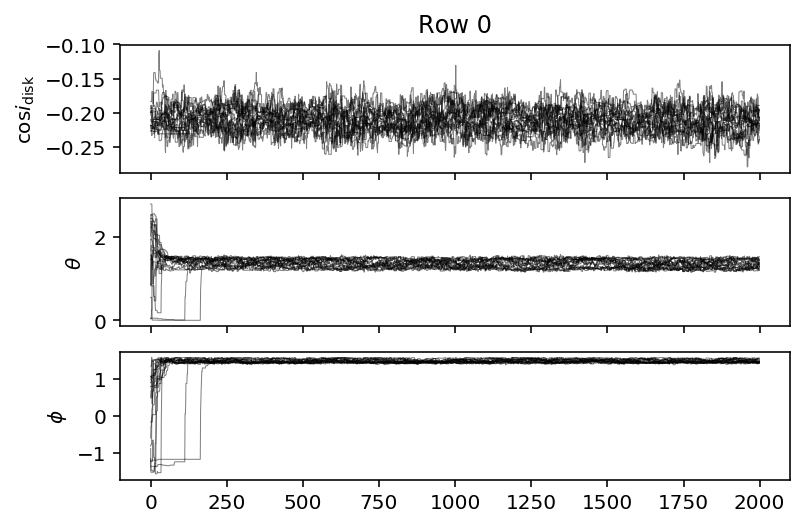

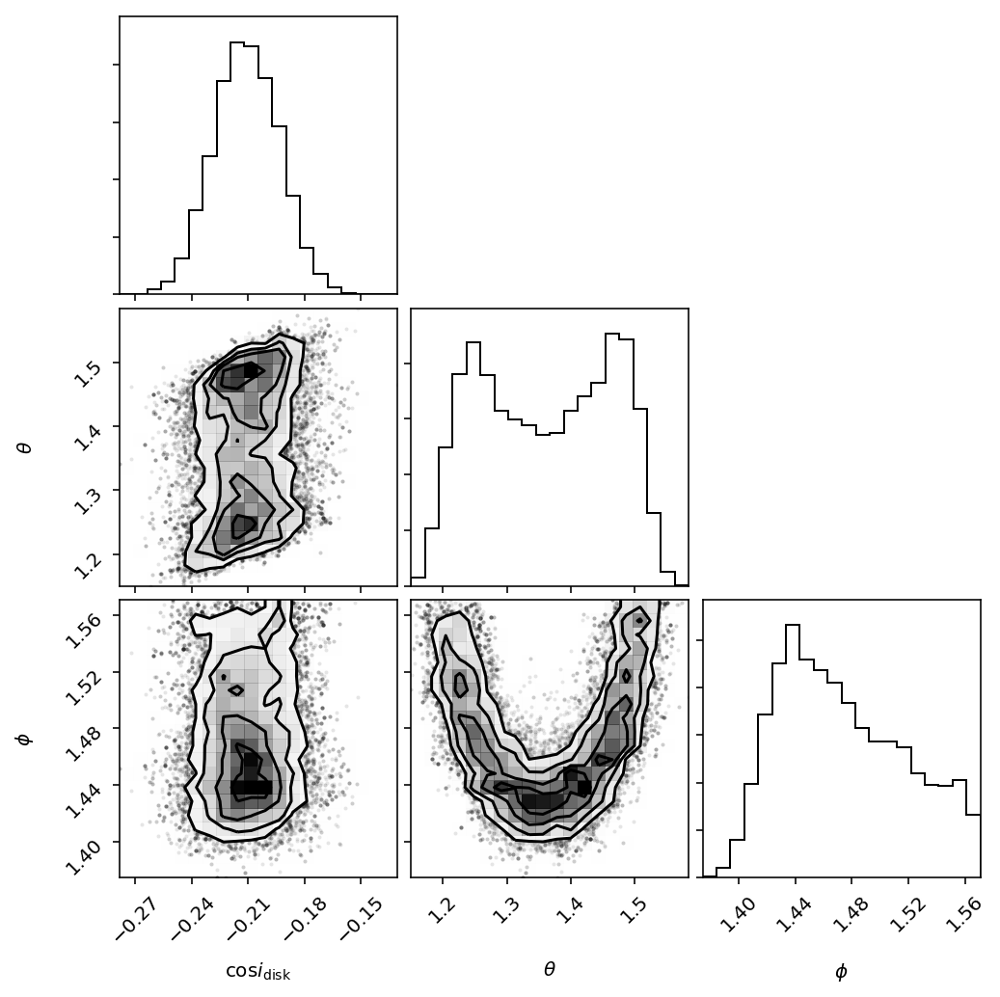

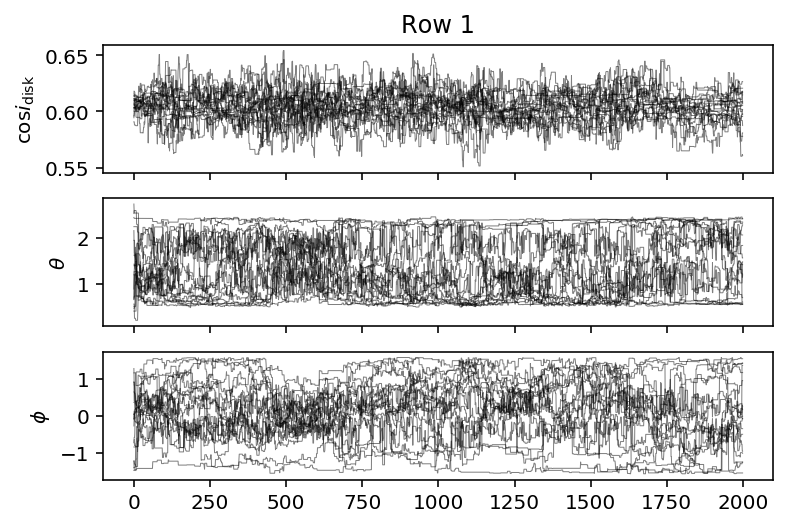

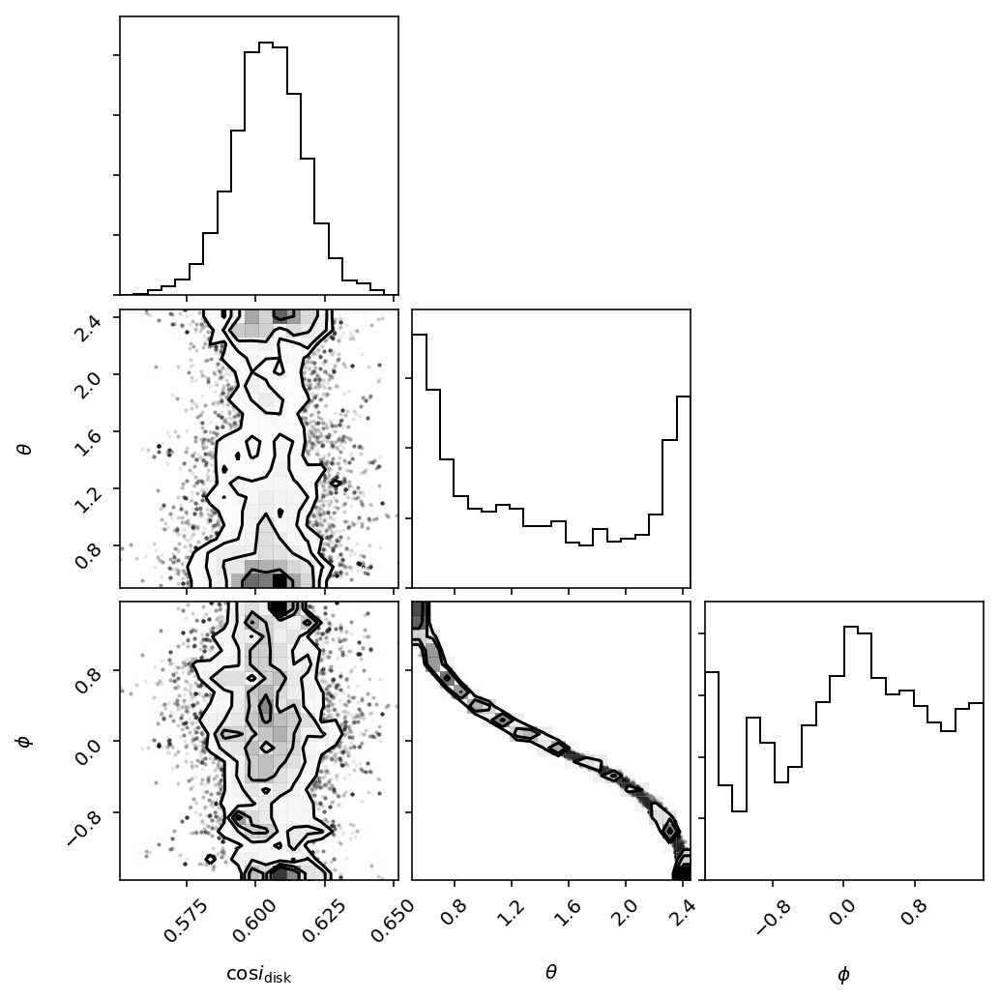

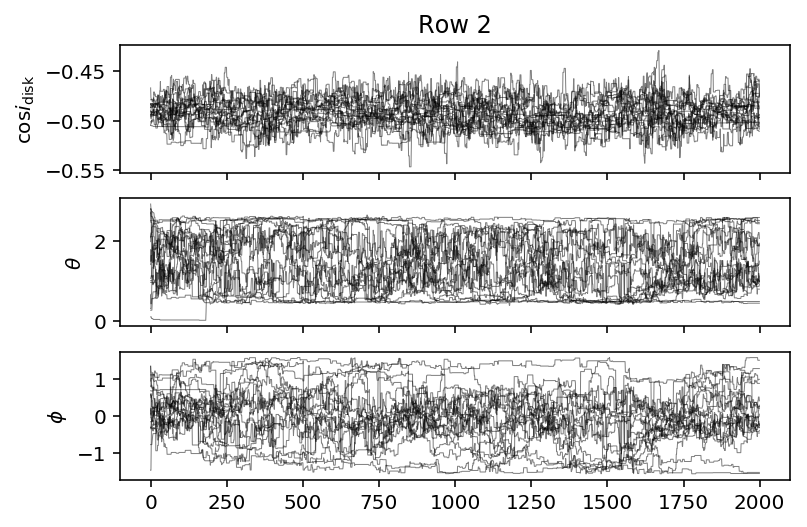

...

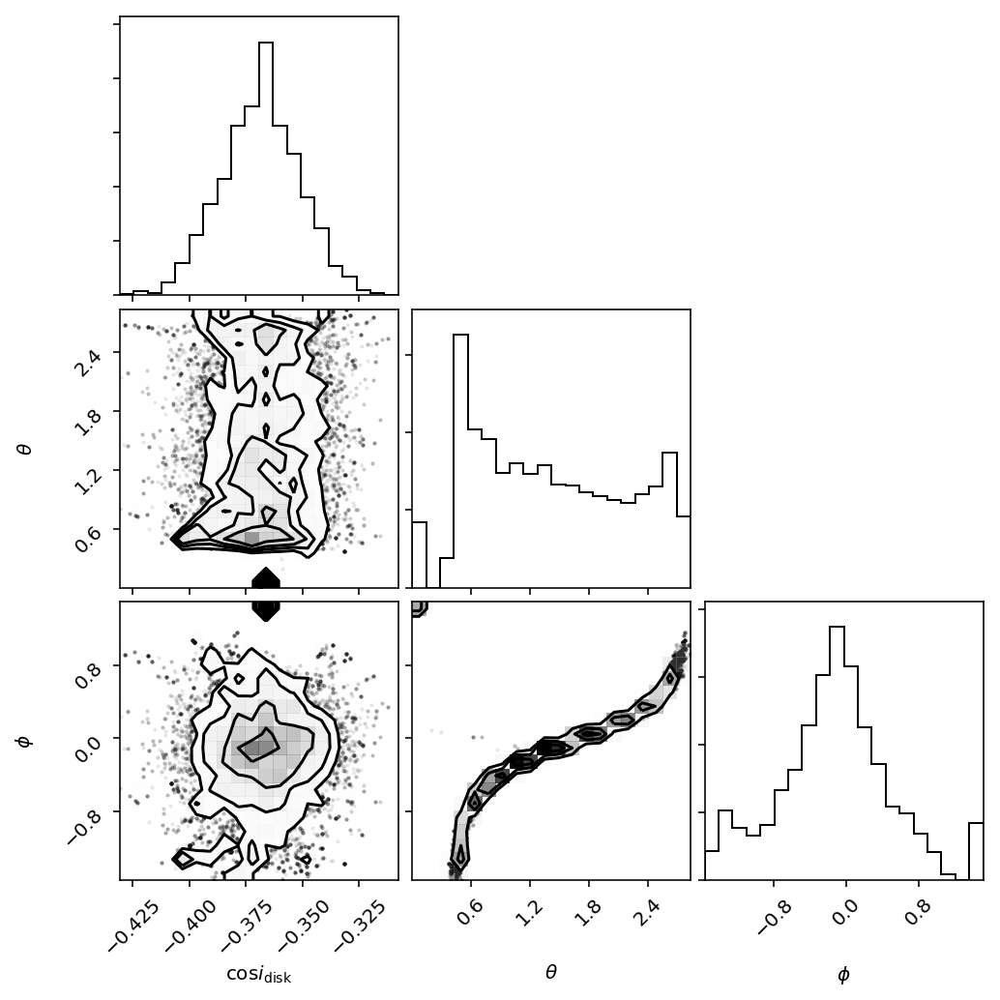

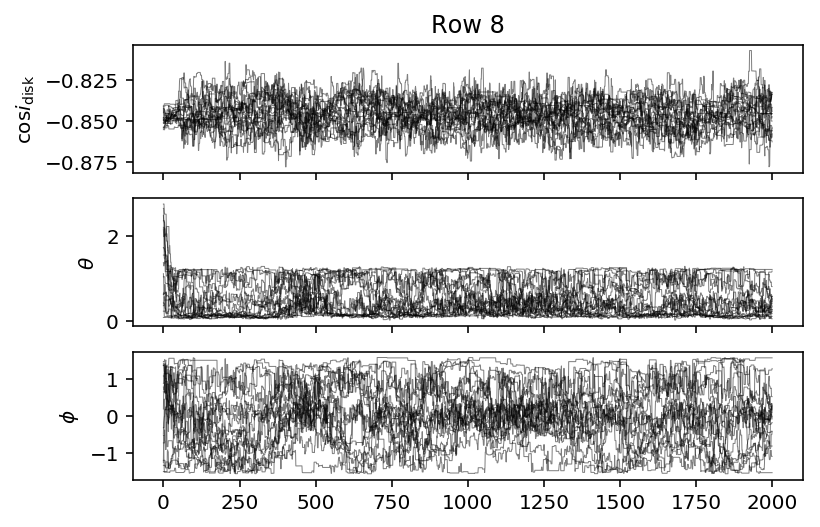

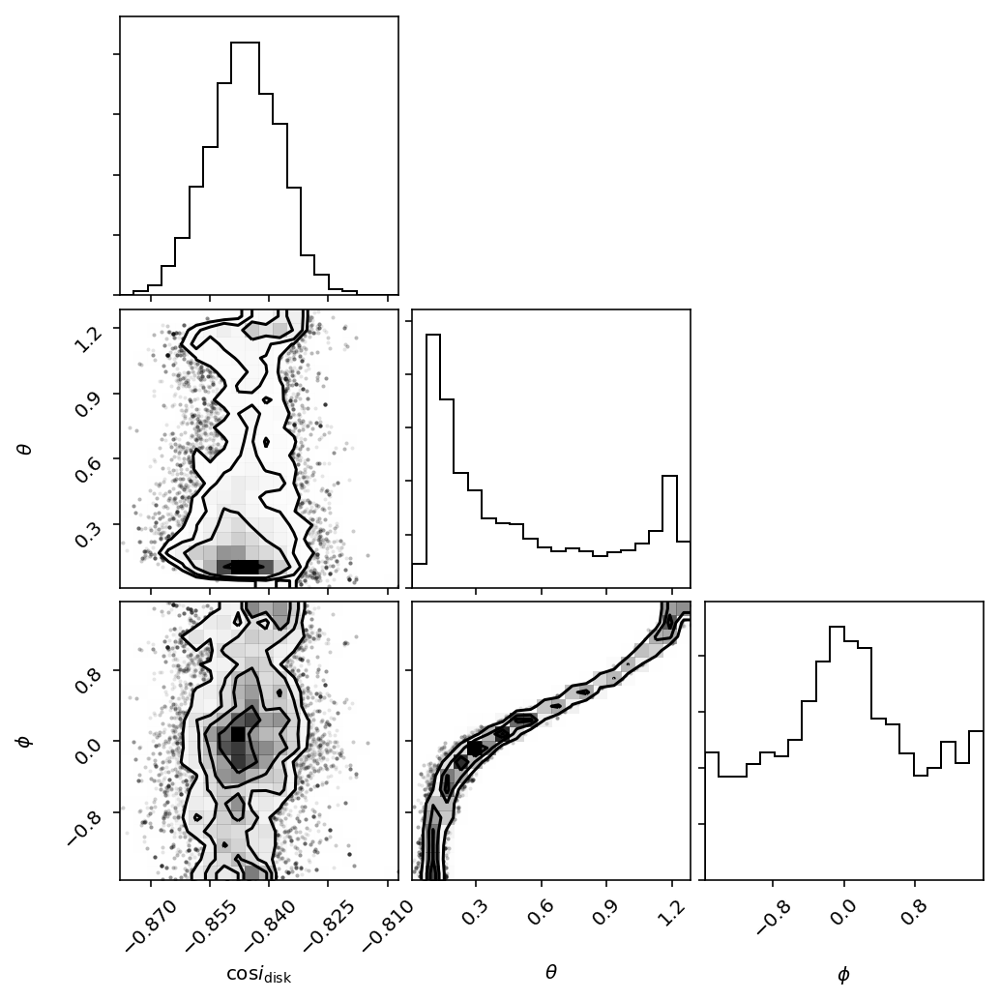

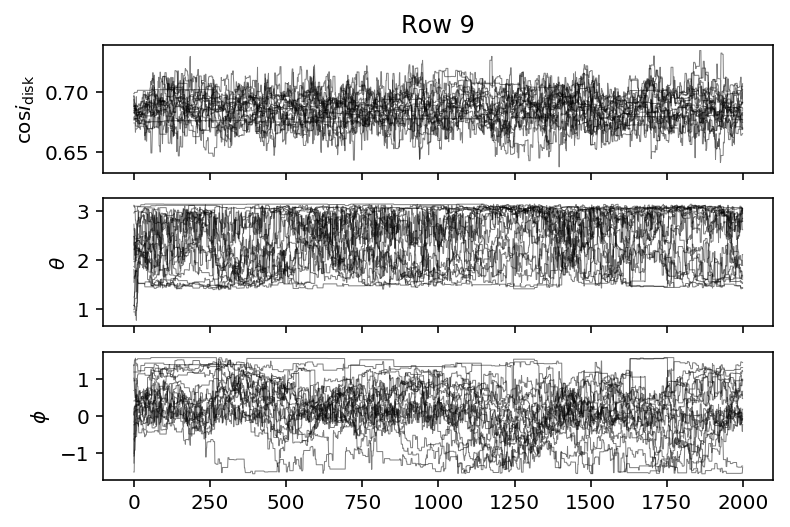

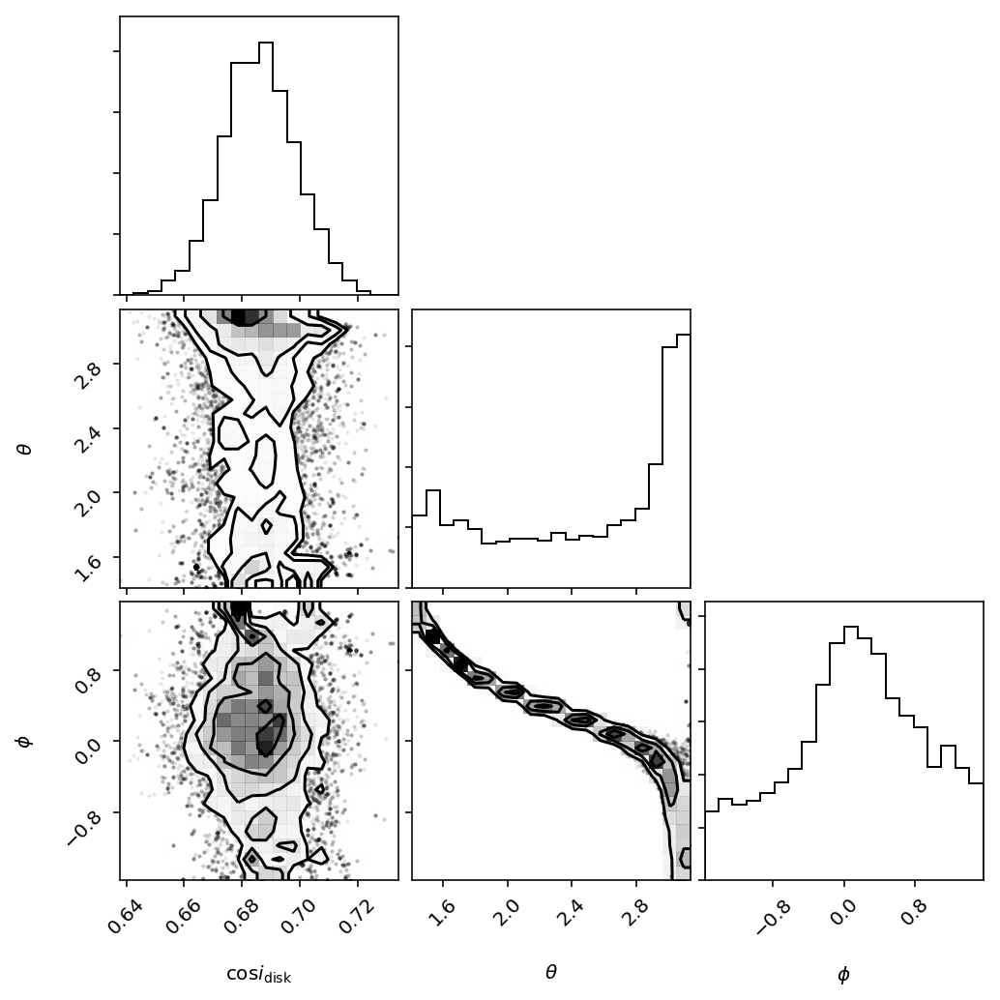

In [92]:
all_samples = np.empty((N_systems, 27000, ndim))

for i,row in enumerate(iso_sample):
    all_samples[i] = sample_row(row, i)

Now that we have all of our samples, we need to reweight them by the prior. Following Hogg et al. 2010,

$$
{\cal L} \approx \prod_{n=1}^N \frac{1}{K} \sum_{k=1}^K \frac{f_\boldsymbol{\alpha}(e_{nk})}{p_0(e_{nk})}
$$

For us, this is 

$$
{\cal L}(\alpha, \beta) \approx \prod_{n=1}^N \frac{1}{K} \sum_{k=1}^K \frac{p(\theta_{nk} |\, \alpha, \beta)}{p_0(\theta_{nk})}
$$

Therefore to evaluate this we need to define the beta distribution. Hopefully numpy has something quick. Since we only need the theta values, we can actually drop most other things.

In [93]:
all_samples.shape

(10, 27000, 3)

In [94]:
theta_samples = all_samples[:,:,1] # between 0 and pi

In [95]:
K = theta_samples.shape[1]

For each system, evaluate the ratio of the new prior to the old prior. The old prior was uniform, so this is easy.

In [103]:
v_samples = theta_samples / np.pi
def likelihood(p):
    log_a, log_b = p
    a = 10**log_a
    b = 10**log_b
    if (log_a <= 0.0) or (a > 50.0) or (log_b <= 0.0) or (b > 50.0):
        return -np.inf
    else:
        return np.sum(np.log(np.sum(beta.pdf(v_samples, a, b), axis=1)))

In [97]:
%%timeit
likelihood([38.0, 19.0])

40.5 ms ± 3.69 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

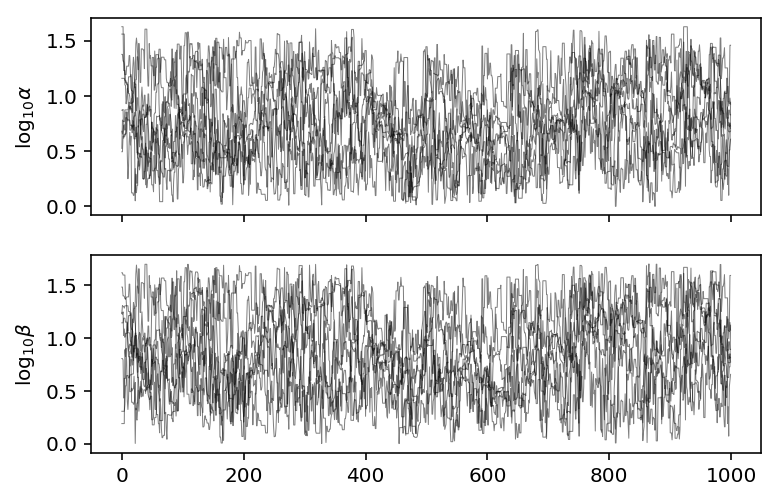

In [104]:
# now, let's assume uniform priors on a and b in the range 1 to 50 and sample
ndim = 2
nwalkers = ndim * 4

 # initialize the sampler with this data
sampler = emcee.EnsembleSampler(nwalkers, ndim, likelihood)

pos0 = np.array([np.random.uniform(0.1, np.log10(45.0), nwalkers),
                 np.random.uniform(0.1, np.log10(45.0), nwalkers)]).T


nsteps = 1000
for i, result in enumerate(sampler.sample(pos0, iterations=nsteps)):
    print(i)
# run 
# sampler.run_mcmc(pos0, 10);

labels = [r"$\log_{10} \alpha$", r"$\log_{10} \beta$"]

# make a diagnostic plot of the walkers
fig, ax = plt.subplots(nrows=ndim, sharex=True)

for i in range(ndim):
    ax[i].set_ylabel(labels[i])
    for j in range(nwalkers):
        ax[i].plot(sampler.chain[j,:,i], color="k", lw=0.5, alpha=0.5)

# make a corner plot after burn in
# samples = sampler.chain[:, 400:, :].reshape((-1, ndim))

# corner.corner(samples, labels=labels);

In [105]:
samples = sampler.chain[:,100:,:].reshape((-1, ndim))

corner.corner(samples);

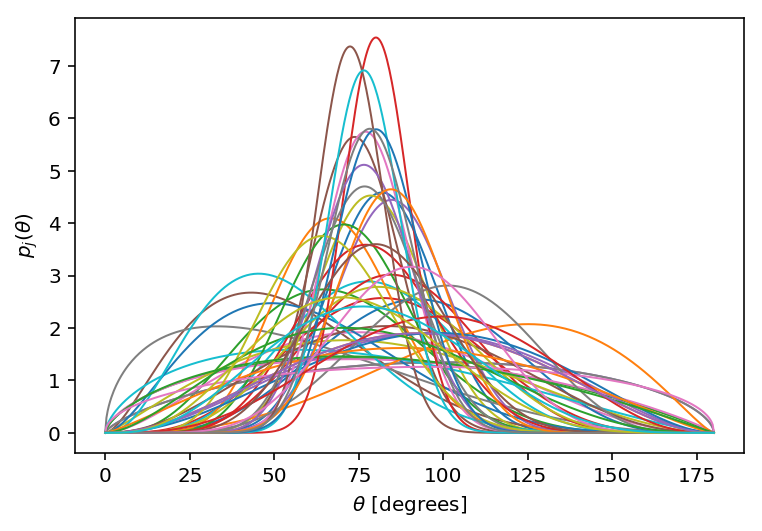

In [107]:
ind = np.random.choice(len(samples), 50)

log_alphas, log_betas = samples[ind].T

vs = np.linspace(0, 1, num=500) # inputs 

fig, ax = plt.subplots(nrows=1)

for i in range(50):
    ys = beta.pdf(vs, 10**log_alphas[i], 10**log_betas[i])
    ax.plot(vs * 180., ys, lw=1.0)
    
ax.set_xlabel(r"$\theta$ [degrees]");
ax.set_ylabel(r"$p_j(\theta)$");

In [27]:
from scipy.stats import beta
import itertools

In [28]:
beta.pdf(0.5, 1.0, 1.0)

1.0

# low inclination sample

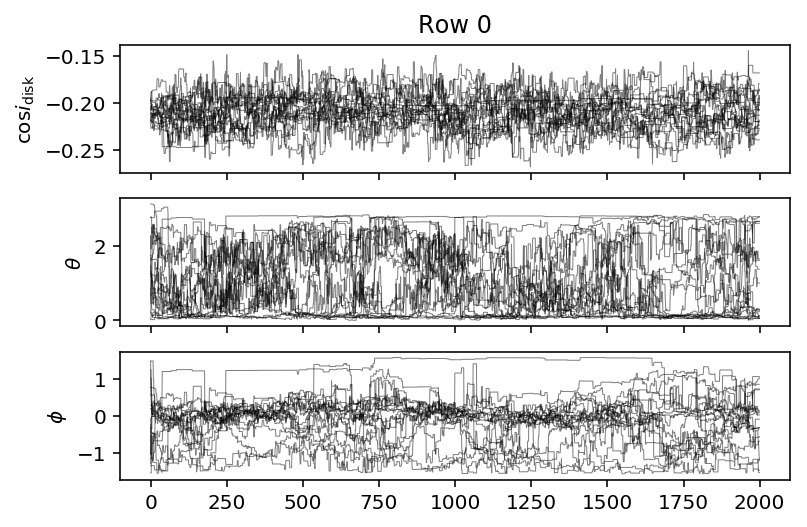

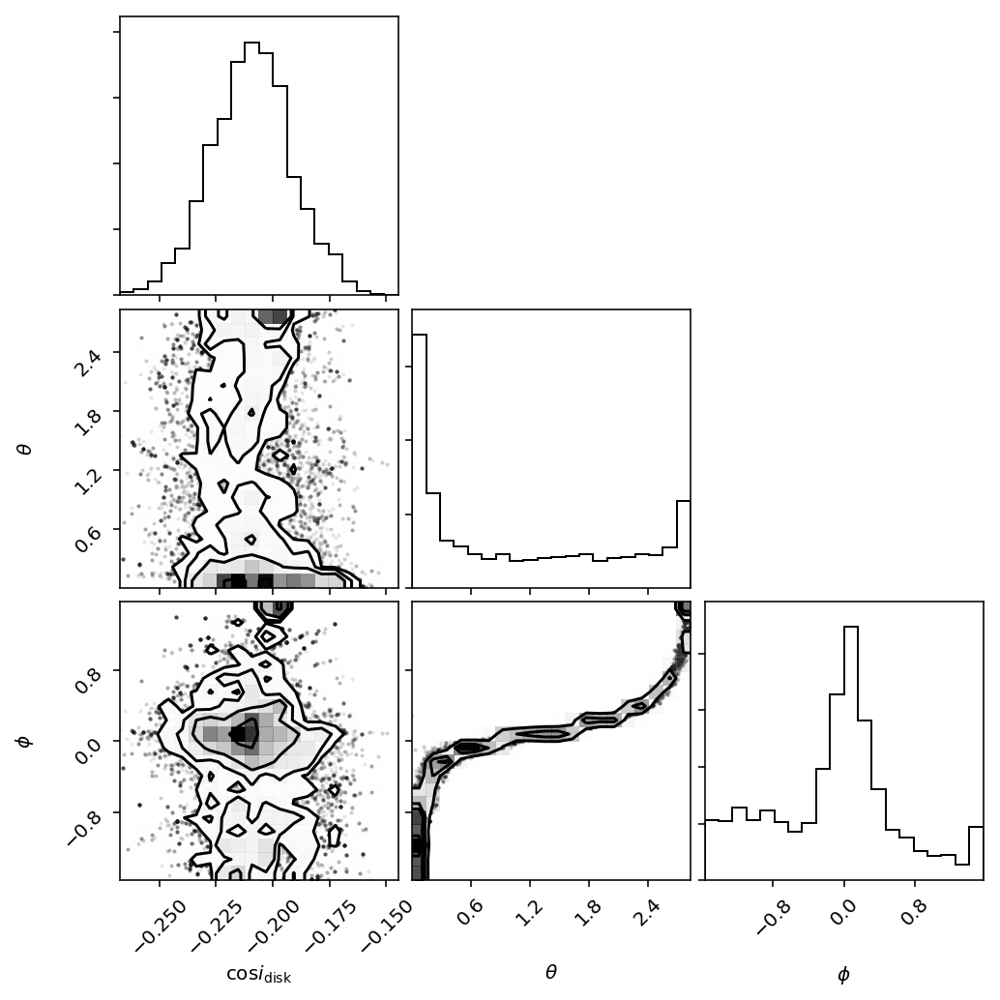

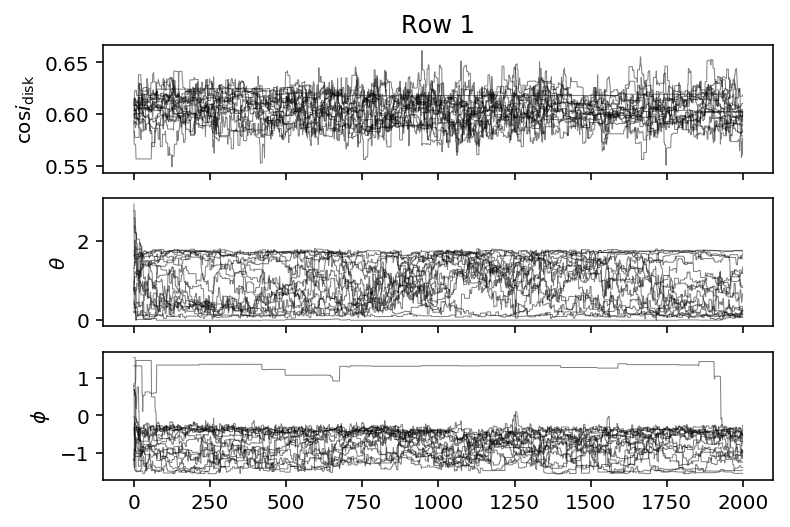

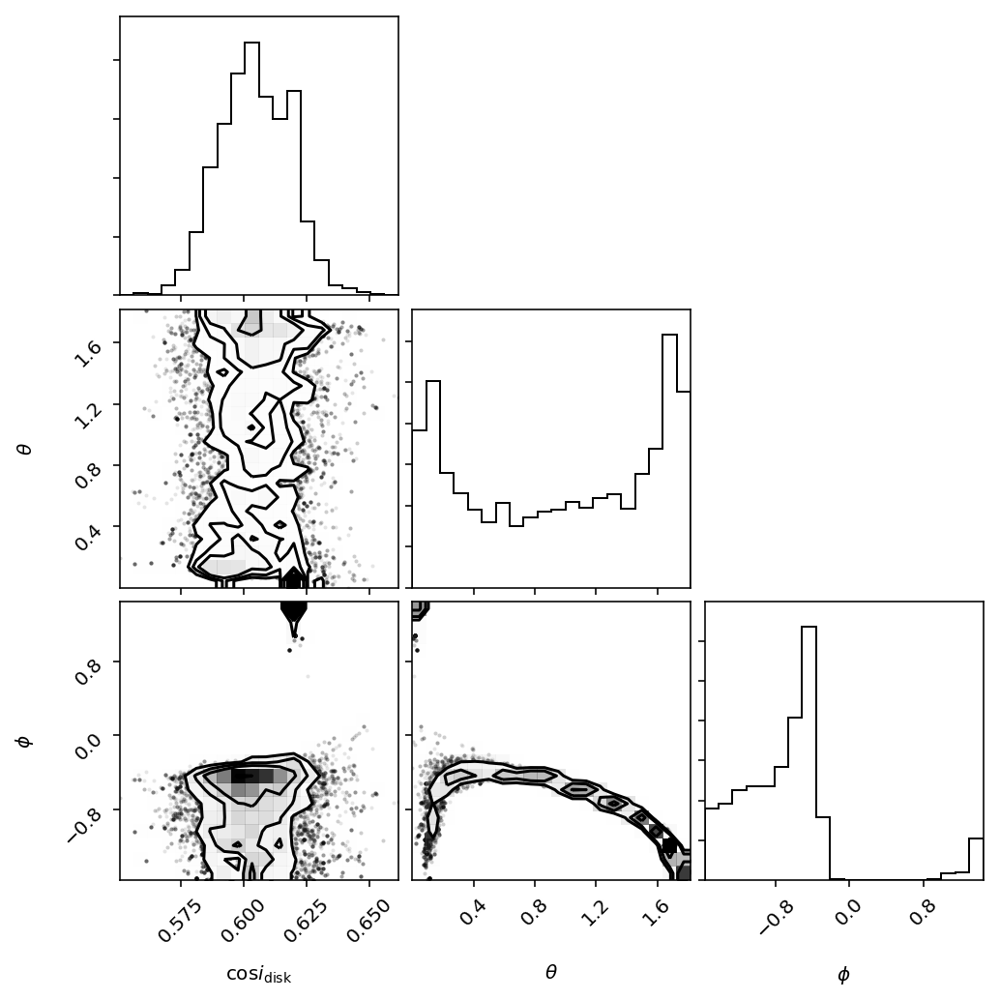

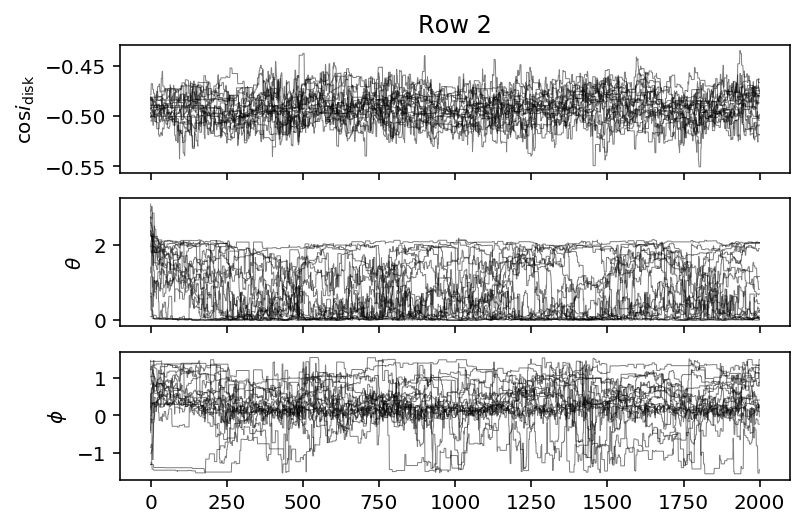

...

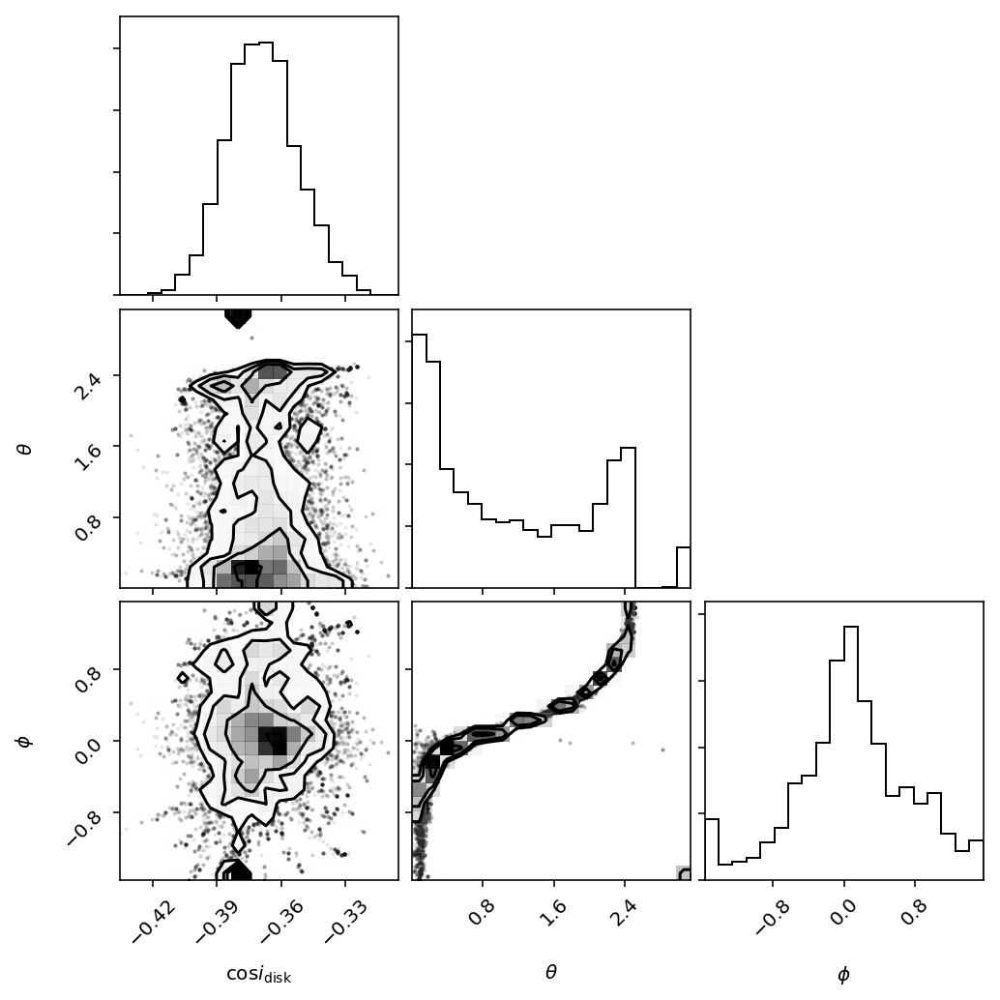

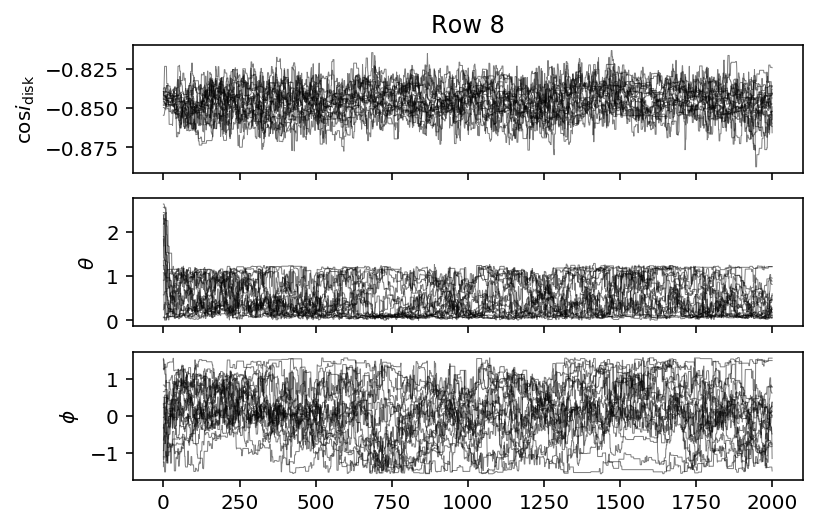

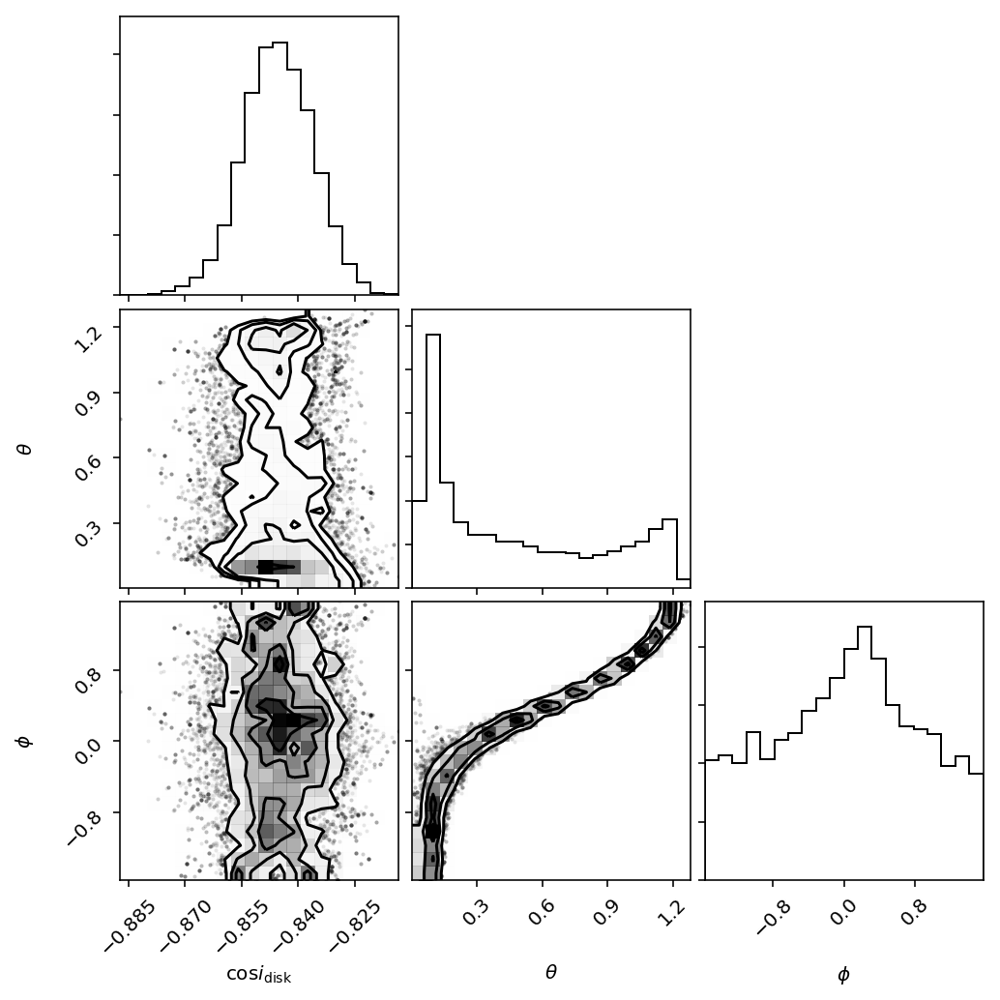

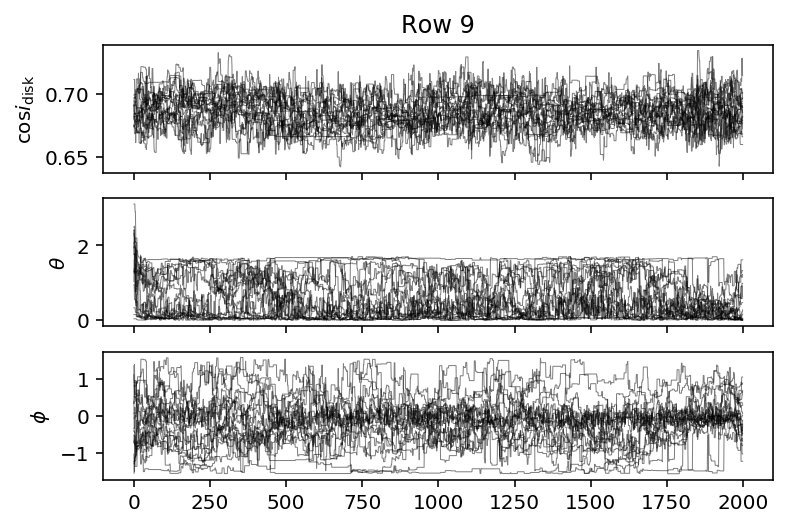

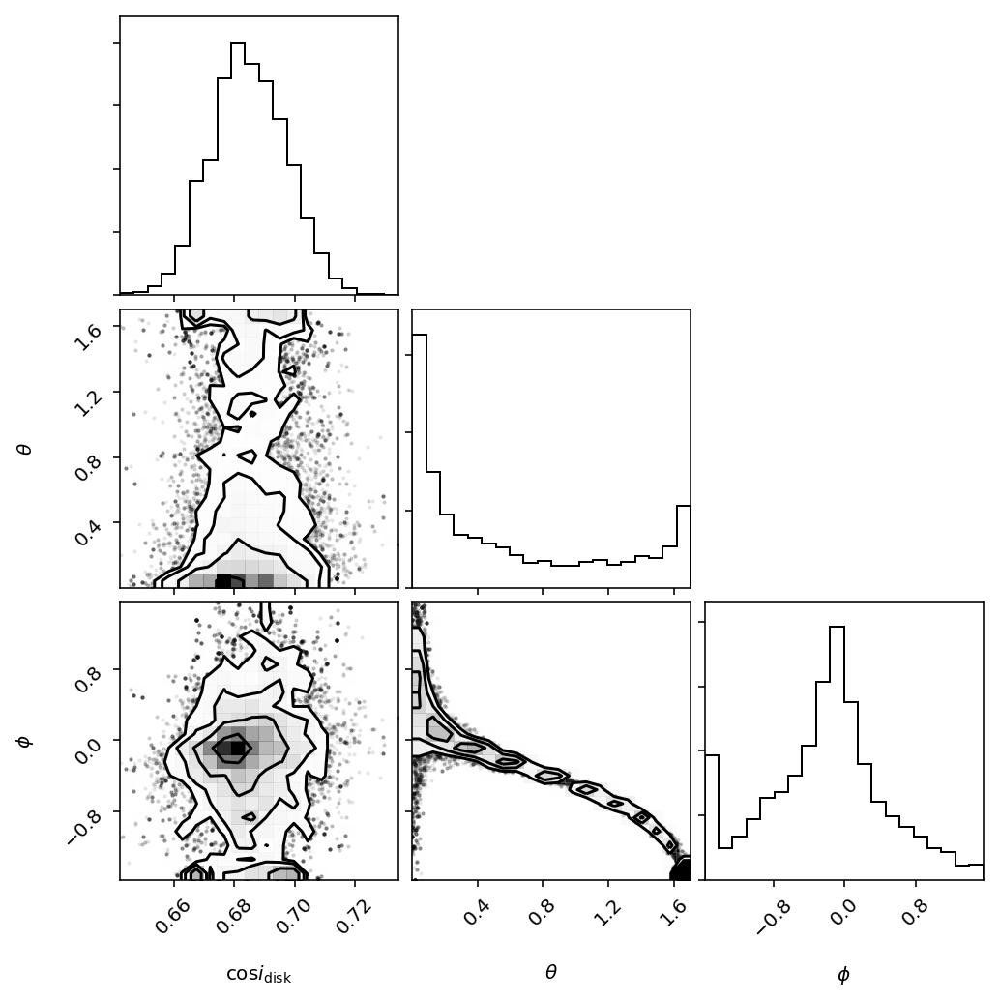

In [112]:
all_samples_low = np.empty((N_systems, 27000, 3))

for i,row in enumerate(low_sample):
    all_samples_low[i] = sample_row(row, i)

In [113]:
theta_samples = all_samples_low[:,:,1] # between 0 and pi
v_samples = theta_samples / np.pi

def likelihood(p):
    log_a, log_b = p
    a = 10**log_a
    b = 10**log_b
    if (log_a <= 0.0) or (a > 50.0) or (log_b <= 0.0) or (b > 50.0):
        return -np.inf
    else:
        return np.sum(np.log(np.sum(beta.pdf(v_samples, a, b), axis=1)))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

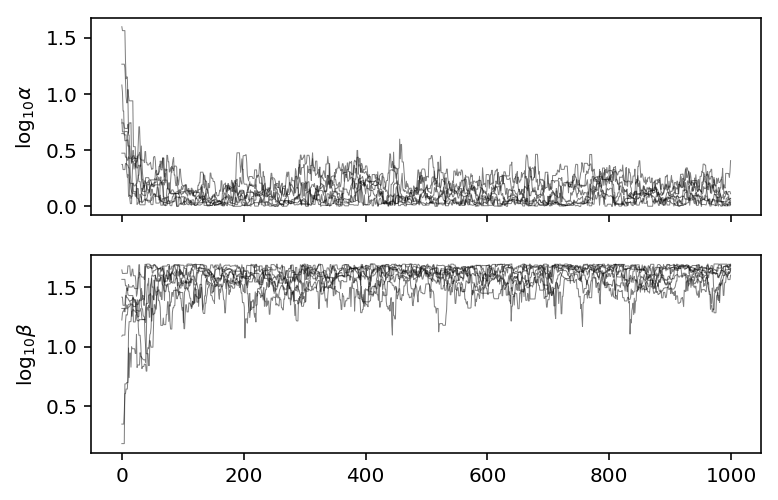

In [114]:
# now, let's assume uniform priors on a and b in the range 1 to 50 and sample
ndim = 2
nwalkers = ndim * 4

 # initialize the sampler with this data
sampler = emcee.EnsembleSampler(nwalkers, ndim, likelihood)

pos0 = np.array([np.random.uniform(0.1, np.log10(45.0), nwalkers),
                 np.random.uniform(0.1, np.log10(45.0), nwalkers)]).T


nsteps = 1000
for i, result in enumerate(sampler.sample(pos0, iterations=nsteps)):
    print(i)
# run 
# sampler.run_mcmc(pos0, 10);

labels = [r"$\log_{10} \alpha$", r"$\log_{10} \beta$"]

# make a diagnostic plot of the walkers
fig, ax = plt.subplots(nrows=ndim, sharex=True)

for i in range(ndim):
    ax[i].set_ylabel(labels[i])
    for j in range(nwalkers):
        ax[i].plot(sampler.chain[j,:,i], color="k", lw=0.5, alpha=0.5)

# make a corner plot after burn in
# samples = sampler.chain[:, 400:, :].reshape((-1, ndim))

# corner.corner(samples, labels=labels);

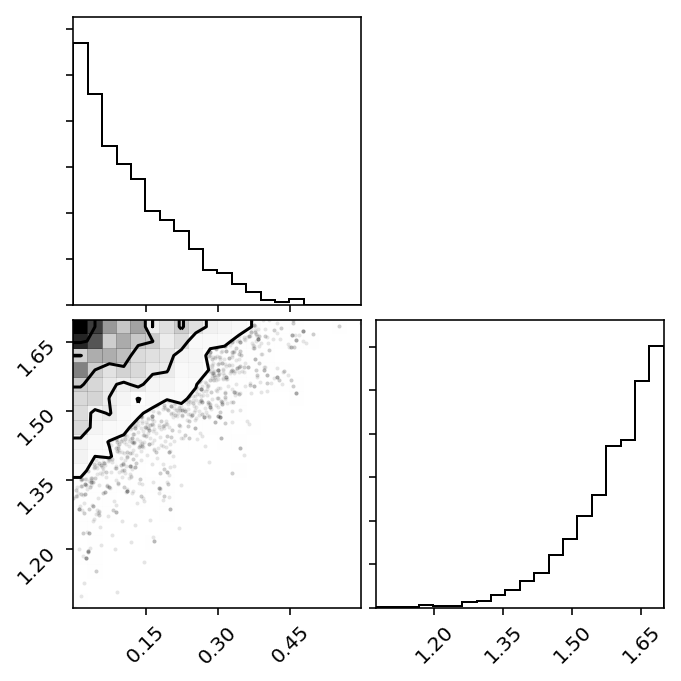

In [115]:
samples = sampler.chain[:,100:,:].reshape((-1, ndim))

corner.corner(samples);

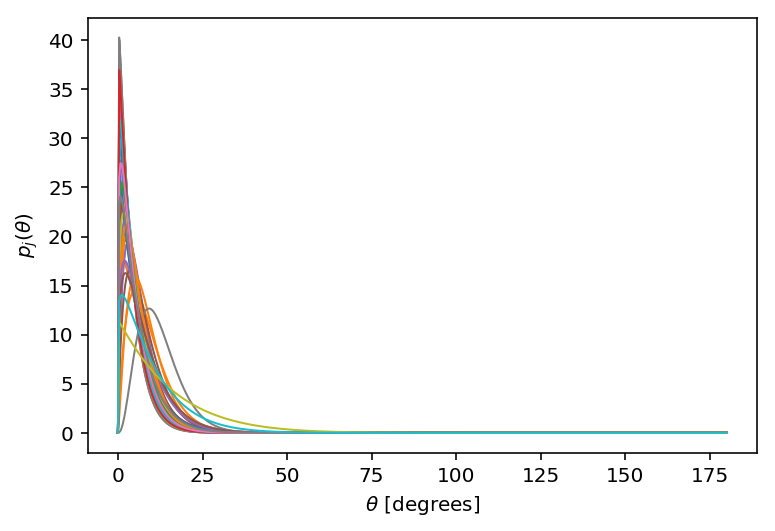

In [116]:
ind = np.random.choice(len(samples), 50)

log_alphas, log_betas = samples[ind].T

vs = np.linspace(0, 1, num=500) # inputs 

fig, ax = plt.subplots(nrows=1)

for i in range(50):
    ys = beta.pdf(vs, 10**log_alphas[i], 10**log_betas[i])
    ax.plot(vs * 180., ys, lw=1.0)
    
ax.set_xlabel(r"$\theta$ [degrees]");
ax.set_ylabel(r"$p_j(\theta)$");